In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import datetime
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [ ]:
%load_ext tensorboard

In [ ]:
from torch.utils.tensorboard import SummaryWriter

In [ ]:
import torch, torchvision

from pathlib import Path
import numpy as np
import cv2
import random
import pandas as pd
from tqdm import tqdm
import PIL.Image as Image
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.ticker import MaxNLocator
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from glob import glob
import shutil
from collections import defaultdict
import scipy
from torch import nn, optim
from torchvision import datasets
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import models
import torchvision.transforms.functional as TF
from scipy.ndimage import distance_transform_edt as distance
from skimage import segmentation as skimage_seg
#from sampler import BalancedBatchSampler

#%matplotlib inline
#%config InlineBackend.figure_format='retina'

#sns.set(style='whitegrid', palette='muted', font_scale=1.2)

#HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

#sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

#rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
torch.cuda.empty_cache()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device =torch.device("cpu")
device

device(type='cuda')

# **Dataset_Name**

In [ ]:
dataset= 'Combined_Final'
method='Preprocessor_cbam_add'

# **Dataset**

In [ ]:

mean_nums = [.275, .275, .275]
std_nums = [.197, .197, .197]


transforms_dict = {'train': T.Compose([
  T.Resize([299,299]),
  T.RandomRotation(degrees=5),
  T.RandomHorizontalFlip(),
  T.RandomPerspective(),
  T.ToTensor(),
  T.Normalize(mean_nums, std_nums)
]), 'validation': T.Compose([
  T.Resize([299,299]),
  T.RandomRotation(degrees=5),
  T.RandomHorizontalFlip(),
  T.RandomPerspective(),
  T.ToTensor(),
  T.Normalize(mean_nums, std_nums)
]), 'test': T.Compose([
  T.Resize([299,299]),
  T.ToTensor(),
  T.Normalize(mean_nums, std_nums)
]),
'mask': T.Compose([
  T.Resize([299,299]),
  #T.RandomRotation(degrees=5),
  #T.RandomHorizontalFlip(),
  #T.RandomPerspective(),
  T.ToTensor()
  #T.Grayscale(num_output_channels=1),

])
}
class MyDataset(Dataset):
    def __init__(self, img_list,us_features=None, train =False,  mask_path = None,transforms = None):
        self.img_list = img_list
        self.mask_path = mask_path
        self.transforms = transforms
        self.train = train
        self.us_features = us_features

    def dist(self, image, mask):

        gt = mask.numpy()
        gt = gt.astype(np.uint8)
        posmask = gt
        negmask = 1-posmask
        posdis = distance(posmask)
        negdis = distance(negmask)
        boundary = skimage_seg.find_boundaries(posmask, mode='inner').astype(np.uint8)
        sdf = (negdis-np.min(negdis))/(np.max(negdis)-np.min(negdis)) - (posdis-np.min(posdis))/(np.max(posdis)-np.min(posdis))

        return sdf

    def get_label(self) :
        labels = []
        for i in self.img_list :
            if i.split('/')[-2] == 'benign' :
                labels.append(0)

            elif i.split('/')[-2] == 'malignant' :
                 labels.append(1)
        return torch.tensor(labels)



    def __getitem__(self, index):

        img_path= self.img_list[index]
        # print(img_path)
        # print(img_path.split('/')[-1])

        inputs = Image.open(img_path)

        if  img_path.split('.')[-1] == 'bmp' :
            inputs = inputs.convert("RGB")
        elif (img_path.split('/')[-1].startswith(f'augmented_fold{fold}') or img_path.split('/')[-1].startswith(f'augmented2_fold{fold}') or img_path.split('/')[-1].startswith(f'augmented3_fold{fold}')):
            if img_path.split('/')[-1].split('_')[-1].startswith('000'):
               inputs = inputs.convert("RGB")
        elif img_path.split('/')[-1].startswith('000'):
            inputs = inputs.convert("RGB")
        elif img_path.split('/')[-1].startswith('Case'):
            inputs = inputs.convert("RGB")
        #inputs = Image.merge("RGB", (inputs, inputs, inputs))

        if self.us_features is not None:


            image_name = img_path.split('/')[-1]

            us_feature = self.us_features.loc[image_name][2:].values

            us_feature = us_feature.astype(float)

        if self.mask_path:
          if img_path.split('.')[-1] == 'png' :
            if img_path.split('/')[-1].split('_')[-1].startswith('000') :
                mask_path = os.path.join(self.mask_path,img_path.split('/')[-1].split('.')[0]+'.png')

            else :
                mask_path = os.path.join(self.mask_path,img_path.split('/')[-1].split('.')[0]+'_mask.png')

          elif  img_path.split('.')[-1] == 'bmp' :
            if img_path.split('/')[-1].split('_')[-1].startswith('us'):
                mask_path = os.path.join(self.mask_path,img_path.split('/')[-1].split('.')[0]+'.bmp')
            else:
                mask_path = os.path.join(self.mask_path,img_path.split('/')[-1].split('.')[0]+'_mask.bmp')

          elif img_path.split('.')[-1] == 'jpg' :
                mask_path = os.path.join(self.mask_path,img_path.split('/')[-1].split('.')[0]+'_mask.jpg')


          masks = Image.open(mask_path)

        if img_path.split('/')[-2] == 'benign' :
            label = 0
        elif img_path.split('/')[-2] == 'malignant' :
            label = 1

        else :
            assert  "Invalid Path" # denominator can't be 0

        if self.transforms :

            inputs = self.transforms[0] (inputs)


            if self.mask_path:
                masks  =  self.transforms[1] (masks)
        if self.mask_path and self.train:
            dist_map = self.dist(inputs, masks)

        if self.train:
            if self.us_features is not None:
               return inputs,label,masks,dist_map,us_feature
            if self.mask_path is not None:
               return inputs,label,masks,dist_map
            else:
               return inputs, label

        else :
            if self.mask_path:
                return inputs,label,masks
            else :
                return inputs,label

    def __len__(self):
        return len(self.img_list)



In [ ]:
import os
def get_list_train_val(fold):
    train_dir =f'/content/drive/My Drive/{dataset}/Fold{fold}{fold}/train'
    validation_dir = f'/content/drive/My Drive/{dataset}/Fold{fold}{fold}/validation'

    train_mask = f'/content/drive/My Drive/{dataset}/all_masks'

    def get_list_of_data (dir_):
        data_list = list()
        dir_sub = [os.path.join(dir_,i).replace('\\','/') for i in os.listdir(dir_)]
        for i in dir_sub:
            list_ = [os.path.join(i,j).replace('\\','/') for j in os.listdir(i)]
            data_list += list_
        return data_list

    train_list_img = get_list_of_data(train_dir)
    val_list_img = get_list_of_data(validation_dir)

    return train_list_img, val_list_img, train_mask

def get_list_test(fold):

    test_dir = f'/content/drive/My Drive/{dataset}/Fold{fold}{fold}/test'
    test_mask = f'/content/drive/My Drive/{dataset}/all_masks'

    def get_list_of_data (dir_):
        data_list = list()
        dir_sub = [os.path.join(dir_,i).replace('\\','/') for i in os.listdir(dir_)]
        for i in dir_sub:
            list_ = [os.path.join(i,j).replace('\\','/') for j in os.listdir(i)]
            data_list += list_
        return data_list

    test_list_img = get_list_of_data(test_dir)


    return test_list_img, test_mask

# test_list_img_1, test_mask1 = get_list_test(fold=1)
# test_list_img_2, test_mask2 = get_list_test(fold=2)
# test_list_img_3, test_mask3 = get_list_test(fold=3)
# test_list_img_4, test_mask4 = get_list_test(fold=4)
# test_list_img_5, test_mask5 = get_list_test(fold=5)
# std = np.array([std_nums])


In [ ]:
class_names = ['benign', 'malignant']

In [ ]:
def imshow(inp, title=None):

  inp = inp.numpy().transpose((1, 2, 0))
  # mean = np.array([mean_nums])
  # std = np.array([std_nums])
  # inp = std * inp + mean
  #print(inp[0,:,:]==inp[1,:,:])
  inp = inp[:,:,0]

  plt.figure(figsize = (21,8))
  plt.imshow(inp, cmap='gray')
  if title is not None:
    plt.title(title)
  plt.axis('off')






In [ ]:
writer = SummaryWriter(f'runs/inception_SEB_Respreprocessor_{dataset}')

# Write image data to TensorBoard log dir



# Model

In [ ]:
class SEBlock(nn.Module):

    def __init__(self, n_features, reduction=8):
        super(SEBlock, self).__init__()

        if n_features % reduction != 0:
            raise ValueError('n_features must be divisible by reduction (default = 16)')

        self.linear1 = nn.Linear(n_features, n_features // reduction, bias=True)
        self.relu = nn.ReLU(inplace=True)
        self.linear2 = nn.Linear(n_features // reduction, n_features, bias=True)
        self.sigmoid = nn.Sigmoid()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):

        y = self.avg_pool(x)
        y = y.permute(0, 2, 3, 1)
        y = self.relu(self.linear1(y))
        y = self.sigmoid(self.linear2(y))
        y = y.permute(0, 3, 1, 2)
        y = x * y
        return y

In [ ]:
class SpatialAttention(nn.Module):
    def __init__(self,kernel_size=1):
        super().__init__()
        self.conv=nn.Conv2d(2,1,kernel_size=kernel_size, padding='same')
        self.sigmoid=nn.Sigmoid()

    def forward(self, x) :
        max_result,_=torch.max(x,dim=1,keepdim=True)
        avg_result=torch.mean(x,dim=1,keepdim=True)
        result=torch.cat([max_result,avg_result],1)
        output=self.conv(result)
        output=self.sigmoid(output)
        x = output*x
        return x

In [ ]:
class prep_model(nn.Module):
    def __init__(self, dropout= False, channel_attention= True, spatial_attention= True,add_sub= True):
        super().__init__()
        self.conv1 = nn.Conv2d(3,192,1)
        self.resnet = models.resnet18(pretrained=True)
        self.resnet.aux_logits=False
        self.conv2 = nn.Conv2d(64,1,1)
        self.drop= dropout
        self.channel_attention= channel_attention
        self.spatial_attention= spatial_attention
        self.addsub= add_sub

        self.dropout= torch.nn.Dropout2d(p=0.5, inplace=False)
        self.seb = SEBlock(64)
        self.sp = SpatialAttention(7)

    def forward(self, x):
        identity = x[:,2:3,:,:]
        b,c,h,w = x.shape

        x = self.resnet.conv1(x)
        x = self.resnet.bn1(x)
        x = self.resnet.maxpool(x)

        #layer1
        x = self.resnet.layer1[0].conv1(x)
        x = self.resnet.layer1[0].bn1(x)
        x = self.resnet.layer1[0].conv2(x)
        x = self.resnet.layer1[0].bn2(x)
        x = self.resnet.layer1[1].conv1(x)
        x = self.resnet.layer1[1].bn1(x)
        x = self.resnet.layer1[1].conv2(x)
        x = self.resnet.layer1[1].bn2(x)

        if self.drop==True:
           x = self.dropout(x)

        if self.spatial_attention==True:
           spa = self.sp(x)
           x = x+spa
           #print(x.shape)

        if self.channel_attention==True:
           x = self.seb(x)

        x = F.interpolate(self.conv2(x),(h,w))


        if self.addsub==True:
           x = identity+x




        return x

In [ ]:
prep= prep_model().to(device)
prep

In [ ]:
class my_model(nn.Module):
    # for input size 224
    def __init__(self):
        super(my_model, self).__init__()
        self.inception = models.inception_v3(pretrained=True)
        self.inception.aux_logits=False
        n_features = self.inception.fc.in_features
        self.seb= SEBlock(2048)
        self.preprocessor= prep_model()
        self.mean=torch.Tensor([0.275]).unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device)
        self.std= torch.Tensor([0.197]).unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device)
        self.inception.fc = nn.Linear(n_features, 2)

        #self.attention_gate = attention_gate(x,g)
        #self.inception.load_state_dict(torch.load('/content/drive/My Drive/Results/Weight/incep.bin'))


    def forward(self, x):
        prep = self.preprocessor(x)
        prep = (prep-self.mean)/self.std
        prep_out = torch.cat([x[:,0:2,:,:],prep],1)
        x = self.inception.Conv2d_1a_3x3(prep_out)
        # N x 32 x 149 x 149
        x = self.inception.Conv2d_2a_3x3(x)
        # N x 32 x 147 x 147
        x = self.inception.Conv2d_2b_3x3(x)
        # N x 64 x 147 x 147
        x = self.inception.maxpool1(x)
        # N x 64 x 73 x 73
        x = self.inception.Conv2d_3b_1x1(x)
        # N x 80 x 73 x 73
        x = self.inception.Conv2d_4a_3x3(x)
        # N x 192 x 71 x 71
        x = self.inception.maxpool2(x)
        # N x 192 x 35 x 35
        x = self.inception.Mixed_5b(x)
        # N x 256 x 35 x 35
        x = self.inception.Mixed_5c(x)
        # N x 288 x 35 x 35
        x = self.inception.Mixed_5d(x)
        # N x 288 x 35 x 35
        x = self.inception.Mixed_6a(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6b(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6c(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6d(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6e(x)
        # N x 768 x 17 x 17
        # N x 768 x 17 x 17
        x = self.inception.Mixed_7a(x)
        # N x 1280 x 8 x 8
        x = self.inception.Mixed_7b(x)
        # N x 2048 x 8 x 8
        x = self.inception.Mixed_7c(x)
        # N x 2048 x 8 x 8
        p = self.seb(x)
        # Adaptive average pooling

        x = self.inception.avgpool(p)
        x = x.view(x.size(0), -1)

        # N x 2048 x 1 x 1
        x = self.inception.dropout(x)
        x = self.inception.fc(x)

        _, target_class = torch.max(x, dim=1)
        b , c, h, w = p.shape
        # get the weights relative to the target class
        fc_weights_class = self.inception.fc.weight[target_class]
        # sum up the multiplication of each weight w_k for the relative channel in the last
        # convolution output

        cam = fc_weights_class.unsqueeze(1) @ p.view((b,c,h * w ))
        cam3 = cam.view(b,h,w)
        cam1 = T.Resize((299, 299))(cam3.clone())
        e,_=torch.min(cam1,1)
        f,_=torch.min(e,1)
        g=f.view(b,1,1)
        cam1=cam1-g

        e,_=torch.max(cam1,1)
        f,_=torch.max(e,1)
        g=f.view(b,1,1)
        cam1= (cam1/g)

        return cam1,x, prep_out




In [ ]:
base_model = my_model()
base_model = base_model.to(device)



In [ ]:
from torchsummary import summary


summary(base_model, (3, 299, 299))

# **Training_epoch**

In [ ]:
import tqdm
def train_epoch(
  model,
  data_loader,
  loss_fn,
  optimizer,
  device,
  scheduler,
  n_examples
):
  model = model.train()

  losses = []
  correct_predictions = []

  for inputs, labels in tqdm.tqdm(data_loader):

    inputs = inputs.to(device)
    labels = labels.to(device)

    cam1,outputs, prep_out = model(inputs)

    output1 = torch.nn.Softmax(dim=1)(outputs)

    pred_value, preds = torch.max(output1, dim=1)

    loss1 = loss_fn(outputs, labels)

    #loss2 = loss_fn2(preds, labels)



    loss= loss1

    correct_predictions.append((torch.mean((preds == labels), dtype= torch.double).cpu().numpy()))
    losses.append(loss.item())

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()



  return np.mean(correct_predictions), np.mean(losses)

# **Validation epoch**

In [ ]:
def eval_model(model, data_loader, loss_fn, device, n_examples):
  model = model.eval()

  losses = []
  correct_predictions = []

  with torch.no_grad():
    for inputs, labels in data_loader:
      inputs = inputs.to(device)
      labels = labels.to(device)

      cam1,outputs, prep_out = model(inputs)
      output1 = torch.nn.Softmax(dim=1)(outputs)

      pred_value, preds = torch.max(output1, dim=1)

      loss1 = loss_fn(outputs, labels)


      loss= loss1


      correct_predictions.append((torch.mean((preds == labels), dtype= torch.double).cpu().numpy()))
      losses.append(loss.item())

  return np.mean(correct_predictions), np.mean(losses)

# **Model Training**

In [ ]:
def train_model(fold, model, device, n_epochs=30):

  #out = torch.from_numpy(out).permute(2,0,1)

  # writer.add_image('images',out[0].unsqueeze(0))
  # writer.flush()

  optimizer = optim.Adam(model.parameters(), lr=0.0001)
  scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.8, patience=2,
                                             threshold=0.0001, threshold_mode='rel', cooldown=0, min_lr=0.000001, eps=1e-08, verbose=True)
  loss_fn1 = nn.CrossEntropyLoss().to(device)


  history = defaultdict(list)
  best_accuracy = 0

  for epoch in range(n_epochs):

    print(f'Epoch {epoch + 1}/{n_epochs}')
    print('-' * 10)

    train_acc, train_loss = train_epoch(
      model,
      train_dataloader,
      loss_fn1,
      optimizer,
      device,
      scheduler,
      dataset_sizes['train']
    )

    print(f'Train loss {train_loss} accuracy {train_acc}')

    val_acc, val_loss = eval_model(
      model,
      val_dataloader,
      loss_fn1,
      device,
      dataset_sizes['validation']
    )

    print(f'Val   loss {val_loss} accuracy {val_acc}')
    print()

    writer.add_scalars(f'Training vs. Validation Loss_Fold{fold}',
                            { 'Training' : train_loss, 'Validation' : val_loss },
                            epoch+1)
    writer.add_scalars(f'Training vs. Validation Accuracy_Fold{fold}',
                            { 'Training' : train_acc, 'Validation' : val_acc },
                            epoch+1)
    writer.close()
    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)

    #if val_acc > best_accuracy:
    torch.save(model.state_dict(), f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin')
    #best_accuracy = val_acc
    scheduler.step(val_loss)
  #print(f'Best val accuracy: {best_accuracy}')

  model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))

  return model, history

# **Training history plotting**

In [ ]:
def plot_training_history(history):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

  ax1.plot(history['train_loss'], label='train loss')
  ax1.plot(history['val_loss'], label='validation loss')

  ax1.xaxis.set_major_locator(MaxNLocator(integer=True))
  #ax1.set_ylim([-0.05, 1.05])
  ax1.legend()
  ax1.set_ylabel('Loss')
  ax1.set_xlabel('Epoch')

  ax2.plot(history['train_acc'], label='train accuracy')
  ax2.plot(history['val_acc'], label='validation accuracy')

  ax2.xaxis.set_major_locator(MaxNLocator(integer=True))
  #ax2.set_ylim([-0.05, 1.05])
  ax2.legend()

  ax2.set_ylabel('Accuracy')
  ax2.set_xlabel('Epoch')

  fig.suptitle('Training history')

# **Get Predictions**

In [ ]:
import tqdm

def get_predictions(fold, model):
  #base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
  model = model.eval()

  test_list_img, test_mask = get_list_test(fold)
  test_dataset = MyDataset(test_list_img,mask_path = test_mask,transforms=[transforms_dict['test'],transforms_dict['mask']])
  test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False)

  predictions = []
  real_values = []
  predictions01 = []
  with torch.no_grad():
    for inputs, labels, masks in tqdm.tqdm(test_dataloader):
      inputs = inputs.to(device)
      labels = labels.to(device)

      cam,outputs, prep_out = model(inputs)
      outputs = nn.Softmax(dim=1)(outputs)
      pred01 = outputs[:,1]
      _, preds = torch.max(outputs, 1)
      predictions.extend(preds)
      real_values.extend(labels)
      predictions01.extend(pred01)
  Output = []
  y=0
# Using iteration to find
  for x in predictions:
      if x != real_values[y]:
          Output.append(y)
      y = y + 1

  # Printing output
  print(Output)
  predictions = torch.as_tensor(predictions).cpu()
  real_values = torch.as_tensor(real_values).cpu()
  return predictions, real_values, predictions01

In [ ]:
def show_confusion_matrix(confusion_matrix, class_names):

  cm = confusion_matrix.copy()

  cell_counts = cm.flatten()

  cm_row_norm = cm / cm.sum(axis=1)[:, np.newaxis]

  row_percentages = ["{0:.2f}".format(value) for value in cm_row_norm.flatten()]

  cell_labels = [f"{cnt}\n{per}" for cnt, per in zip(cell_counts, row_percentages)]
  cell_labels = np.asarray(cell_labels).reshape(cm.shape[0], cm.shape[1])

  df_cm = pd.DataFrame(cm_row_norm, index=class_names, columns=class_names)

  hmap = sns.heatmap(df_cm, annot=cell_labels, fmt="", cmap="Blues")
  hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
  hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
  plt.ylabel('True Sign')
  plt.xlabel('Predicted Sign');

In [ ]:
process=2

In [ ]:
import pandas as pd

# Initialize DataFrame
columns = ['Fold', 'Accuracy', 'Sensitivity', 'Specificity', 'F-1 score', 'MCC', 'AUC', 'Dice', 'IoU']
metrics = pd.DataFrame(columns=columns)

# **Fold1**

{'train': 1548, 'validation': 233, 'mask': 1548}


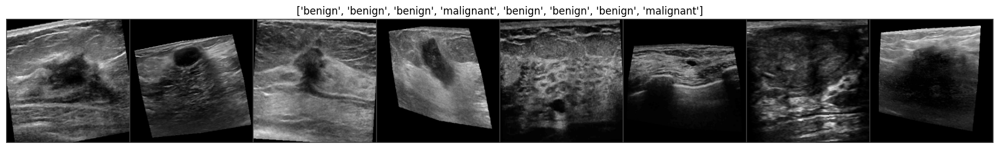

In [ ]:
fold=1
train_list_img, val_list_img, train_mask= get_list_train_val(fold)

train_dataset = MyDataset(train_list_img,us_features = None, train =True,  mask_path = None,transforms =[transforms_dict['train'],transforms_dict['mask']])
train_dataloader = DataLoader(train_dataset,batch_size=8, shuffle = True, drop_last = True)

val_dataset = MyDataset(val_list_img,transforms=[transforms_dict['validation']])
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True)

dataset_sizes = {'train' : len(train_dataset),'validation':len(val_dataset), 'mask' :len(train_dataset)}
print(dataset_sizes)

inputs,classes = next(iter(train_dataloader))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])


In [ ]:
fold=1
base_model = my_model()
base_model = base_model.to(device)
base_model, history = train_model(fold, base_model, device)
plot_training_history(history)

In [ ]:
import pandas as pd
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score,roc_curve, auc


class_names=['benign','malignant']
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
y_pred, y_test, y_pred01 = get_predictions(fold, base_model )
#print(y_pred01)
report=classification_report(y_test, y_pred, target_names=class_names,output_dict= True)
# print(classification_report(y_test, y_pred, target_names=class_names))

#specificity
cm = confusion_matrix(y_test, y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]

#Accuracy
acc= (TP+TN)/(TP+TN+FN+FP)
print("Accuracy:", acc)

#Sen
sp= TN/(TN+FP)
print('Specificity: ', sp )

#Spe
sn= TP/(TP+FN)
print('Sensitivity: ', sn )

#F_1
F1= (TP+TP)/(TP+TP+FN+FP)
print("F1 score:", F1)

#MCC
mcc = (TP * TN - FP * FN) / (((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)) ** 0.5)
print("MCC score:", mcc)

#AUC
y_pred01_cpu = [tensor.cpu().numpy().item() for tensor in y_pred01]
y_test_cpu = [tensor.cpu().numpy().item() for tensor in y_test]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test_cpu, y_pred01_cpu)
roc_auc = auc(false_positive_rate, true_positive_rate)
auc_score = roc_auc_score(y_test_cpu, y_pred01_cpu)
print("AUC score:", roc_auc)

metrics = metrics.append({'Fold': fold, 'Accuracy': acc, 'Sensitivity': sn, 'Specificity': sp, 'F-1 score': F1,
                'MCC': mcc, 'AUC': roc_auc}, ignore_index=True)


#confusion matrix
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm, class_names)

result_save_path = '/content/drive/My Drive/Results/Result/'
confusion_matrix_save_path = '/content/drive/My Drive/Results/Confusion Matrix/'
model_name=f'inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add'
result_df = report
result_df = pd.DataFrame(result_df).transpose()

print(result_df)

result_df.to_csv(result_save_path+model_name+'_result.csv')


# **Fold2**

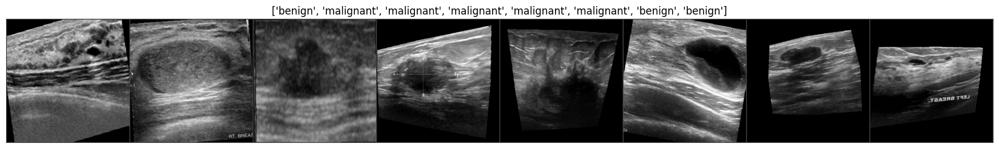

In [ ]:
fold=2
train_list_img, val_list_img, train_mask= get_list_train_val(fold)

train_dataset = MyDataset(train_list_img,us_features = None, train =True,  mask_path = None,transforms =[transforms_dict['train'],transforms_dict['mask']])
train_dataloader = DataLoader(train_dataset,batch_size=8, shuffle = True, drop_last = True)

val_dataset = MyDataset(val_list_img,transforms=[transforms_dict['validation']])
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True)

dataset_sizes = {'train' : len(train_dataset),'validation':len(val_dataset), 'mask' :len(train_dataset)}

inputs,classes = next(iter(train_dataloader))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])


In [ ]:
base_model = my_model()
base_model = base_model.to(device)

base_model, history = train_model(fold, base_model, device)
plot_training_history(history)

In [ ]:
import pandas as pd
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score,roc_curve, auc


class_names=['benign','malignant']
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
y_pred, y_test, y_pred01 = get_predictions(fold, base_model )
#print(y_pred01)
report=classification_report(y_test, y_pred, target_names=class_names,output_dict= True)
# print(classification_report(y_test, y_pred, target_names=class_names))

#specificity
cm = confusion_matrix(y_test, y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]

#Accuracy
acc= (TP+TN)/(TP+TN+FN+FP)
print("Accuracy:", acc)

#Sen
sp= TN/(TN+FP)
print('Specificity: ', sp )

#Spe
sn= TP/(TP+FN)
print('Sensitivity: ', sn )

#F_1
F1= (TP+TP)/(TP+TP+FN+FP)
print("F1 score:", F1)

#MCC
mcc = (TP * TN - FP * FN) / (((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)) ** 0.5)
print("MCC score:", mcc)

#AUC
y_pred01_cpu = [tensor.cpu().numpy().item() for tensor in y_pred01]
y_test_cpu = [tensor.cpu().numpy().item() for tensor in y_test]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test_cpu, y_pred01_cpu)
roc_auc = auc(false_positive_rate, true_positive_rate)
auc_score = roc_auc_score(y_test_cpu, y_pred01_cpu)
print("AUC score:", roc_auc)

metrics = metrics.append({'Fold': fold, 'Accuracy': acc, 'Sensitivity': sn, 'Specificity': sp, 'F-1 score': F1,
                'MCC': mcc, 'AUC': roc_auc}, ignore_index=True)


#confusion matrix
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm, class_names)

result_save_path = '/content/drive/My Drive/Results/Result/'
confusion_matrix_save_path = '/content/drive/My Drive/Results/Confusion Matrix/'
model_name=f'inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add'
result_df = report
result_df = pd.DataFrame(result_df).transpose()

print(result_df)

result_df.to_csv(result_save_path+model_name+'_result.csv')


# **Fold3**

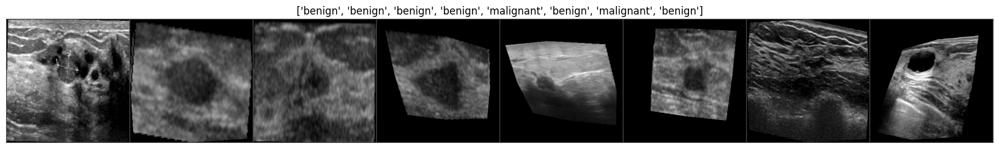

In [ ]:
fold=3
train_list_img, val_list_img, train_mask= get_list_train_val(fold)

train_dataset = MyDataset(train_list_img,us_features = None, train =True,  mask_path = None,transforms =[transforms_dict['train'],transforms_dict['mask']])
train_dataloader = DataLoader(train_dataset,batch_size=8, shuffle = True, drop_last = True)

val_dataset = MyDataset(val_list_img,transforms=[transforms_dict['validation']])
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True)

dataset_sizes = {'train' : len(train_dataset),'validation':len(val_dataset), 'mask' :len(train_dataset)}

inputs,classes = next(iter(train_dataloader))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])


In [ ]:
base_model = my_model()
base_model = base_model.to(device)
base_model, history = train_model(fold, base_model, device)
plot_training_history(history)

In [ ]:
import pandas as pd
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score,roc_curve, auc


class_names=['benign','malignant']
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
y_pred, y_test, y_pred01 = get_predictions(fold, base_model )
#print(y_pred01)
report=classification_report(y_test, y_pred, target_names=class_names,output_dict= True)
# print(classification_report(y_test, y_pred, target_names=class_names))

#specificity
cm = confusion_matrix(y_test, y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]

#Accuracy
acc= (TP+TN)/(TP+TN+FN+FP)
print("Accuracy:", acc)

#Sen
sp= TN/(TN+FP)
print('Specificity: ', sp )

#Spe
sn= TP/(TP+FN)
print('Sensitivity: ', sn )

#F_1
F1= (TP+TP)/(TP+TP+FN+FP)
print("F1 score:", F1)

#MCC
mcc = (TP * TN - FP * FN) / (((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)) ** 0.5)
print("MCC score:", mcc)

#AUC
y_pred01_cpu = [tensor.cpu().numpy().item() for tensor in y_pred01]
y_test_cpu = [tensor.cpu().numpy().item() for tensor in y_test]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test_cpu, y_pred01_cpu)
roc_auc = auc(false_positive_rate, true_positive_rate)
auc_score = roc_auc_score(y_test_cpu, y_pred01_cpu)
print("AUC score:", roc_auc)

metrics = metrics.append({'Fold': fold, 'Accuracy': acc, 'Sensitivity': sn, 'Specificity': sp, 'F-1 score': F1,
                'MCC': mcc, 'AUC': roc_auc}, ignore_index=True)


#confusion matrix
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm, class_names)

result_save_path = '/content/drive/My Drive/Results/Result/'
confusion_matrix_save_path = '/content/drive/My Drive/Results/Confusion Matrix/'
model_name=f'inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add'
result_df = report
result_df = pd.DataFrame(result_df).transpose()

print(result_df)

result_df.to_csv(result_save_path+model_name+'_result.csv')


# **Fold4**

{'train': 1549, 'validation': 232, 'mask': 1549}


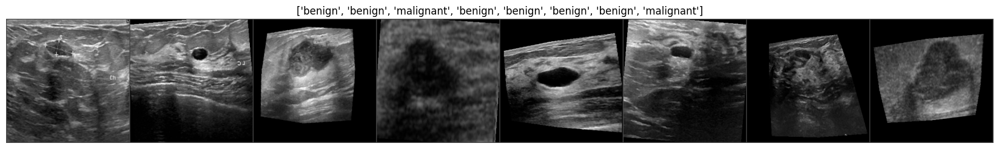

In [ ]:
fold=4
train_list_img, val_list_img, train_mask= get_list_train_val(fold)

train_dataset = MyDataset(train_list_img,us_features = None, train =True,  mask_path = None,transforms =[transforms_dict['train'],transforms_dict['mask']])
train_dataloader = DataLoader(train_dataset,batch_size=8, shuffle = True, drop_last = True)

val_dataset = MyDataset(val_list_img,transforms=[transforms_dict['validation']])
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True)

dataset_sizes = {'train' : len(train_dataset),'validation':len(val_dataset), 'mask' :len(train_dataset)}
print(dataset_sizes)

inputs,classes = next(iter(train_dataloader))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])


In [ ]:
base_model = my_model()
base_model = base_model.to(device)
base_model, history = train_model(fold, base_model, device)
plot_training_history(history)

In [ ]:
import pandas as pd
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score,roc_curve, auc


class_names=['benign','malignant']
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
y_pred, y_test, y_pred01 = get_predictions(fold, base_model )
#print(y_pred01)
report=classification_report(y_test, y_pred, target_names=class_names,output_dict= True)
# print(classification_report(y_test, y_pred, target_names=class_names))

#specificity
cm = confusion_matrix(y_test, y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]

#Accuracy
acc= (TP+TN)/(TP+TN+FN+FP)
print("Accuracy:", acc)

#Sen
sp= TN/(TN+FP)
print('Specificity: ', sp )

#Spe
sn= TP/(TP+FN)
print('Sensitivity: ', sn )

#F_1
F1= (TP+TP)/(TP+TP+FN+FP)
print("F1 score:", F1)

#MCC
mcc = (TP * TN - FP * FN) / (((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)) ** 0.5)
print("MCC score:", mcc)

#AUC
y_pred01_cpu = [tensor.cpu().numpy().item() for tensor in y_pred01]
y_test_cpu = [tensor.cpu().numpy().item() for tensor in y_test]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test_cpu, y_pred01_cpu)
roc_auc = auc(false_positive_rate, true_positive_rate)
auc_score = roc_auc_score(y_test_cpu, y_pred01_cpu)
print("AUC score:", roc_auc)

metrics = metrics.append({'Fold': fold, 'Accuracy': acc, 'Sensitivity': sn, 'Specificity': sp, 'F-1 score': F1,
                'MCC': mcc, 'AUC': roc_auc}, ignore_index=True)


#confusion matrix
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm, class_names)

result_save_path = '/content/drive/My Drive/Results/Result/'
confusion_matrix_save_path = '/content/drive/My Drive/Results/Confusion Matrix/'
model_name=f'inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add'
result_df = report
result_df = pd.DataFrame(result_df).transpose()

print(result_df)

result_df.to_csv(result_save_path+model_name+'_result.csv')


# **Fold5**

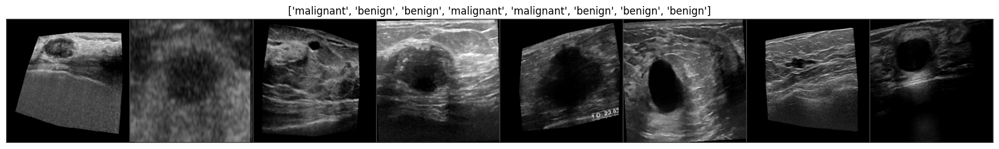

In [ ]:
fold=5
train_list_img, val_list_img, train_mask= get_list_train_val(fold)

train_dataset = MyDataset(train_list_img,us_features = None, train =True,  mask_path = None,transforms =[transforms_dict['train'],transforms_dict['mask']])
train_dataloader = DataLoader(train_dataset,batch_size=8, shuffle = True, drop_last = True)

val_dataset = MyDataset(val_list_img,transforms=[transforms_dict['validation']])
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True)

dataset_sizes = {'train' : len(train_dataset),'validation':len(val_dataset), 'mask' :len(train_dataset)}

inputs,classes = next(iter(train_dataloader))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])


In [ ]:
base_model = my_model()
base_model = base_model.to(device)
base_model, history = train_model(fold, base_model, device)
plot_training_history(history)

In [ ]:
import pandas as pd
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score,roc_curve, auc


class_names=['benign','malignant']
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
y_pred, y_test, y_pred01 = get_predictions(fold, base_model )
#print(y_pred01)
report=classification_report(y_test, y_pred, target_names=class_names,output_dict= True)
# print(classification_report(y_test, y_pred, target_names=class_names))

#specificity
cm = confusion_matrix(y_test, y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]

#Accuracy
acc= (TP+TN)/(TP+TN+FN+FP)
print("Accuracy:", acc)

#Sen
sp= TN/(TN+FP)
print('Specificity: ', sp )

#Spe
sn= TP/(TP+FN)
print('Sensitivity: ', sn )

#F_1
F1= (TP+TP)/(TP+TP+FN+FP)
print("F1 score:", F1)

#MCC
mcc = (TP * TN - FP * FN) / (((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)) ** 0.5)
print("MCC score:", mcc)

#AUC
y_pred01_cpu = [tensor.cpu().numpy().item() for tensor in y_pred01]
y_test_cpu = [tensor.cpu().numpy().item() for tensor in y_test]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test_cpu, y_pred01_cpu)
roc_auc = auc(false_positive_rate, true_positive_rate)
auc_score = roc_auc_score(y_test_cpu, y_pred01_cpu)
print("AUC score:", roc_auc)

metrics = metrics.append({'Fold': fold, 'Accuracy': acc, 'Sensitivity': sn, 'Specificity': sp, 'F-1 score': F1,
                'MCC': mcc, 'AUC': roc_auc}, ignore_index=True)


#confusion matrix
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm, class_names)

result_save_path = '/content/drive/My Drive/Results/Result/'
confusion_matrix_save_path = '/content/drive/My Drive/Results/Confusion Matrix/'
model_name=f'inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add'
result_df = report
result_df = pd.DataFrame(result_df).transpose()

print(result_df)

result_df.to_csv(result_save_path+model_name+'_result.csv')


In [ ]:
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

# **Visualizing Prepricessor Output**

In [ ]:
fold =1

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


torch.Size([8, 3, 299, 299])


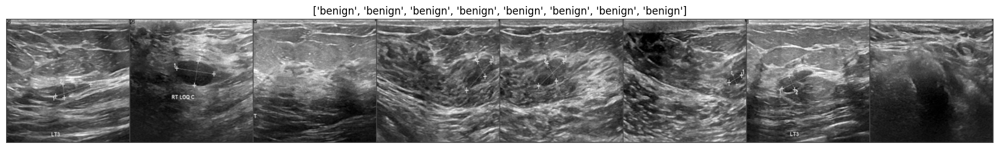

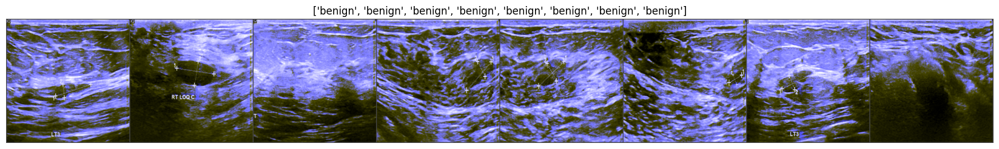

In [ ]:
from torchvision.io.image import read_image
from torchvision.transforms.functional import normalize, resize, to_pil_image
from torchvision.models import resnet18
mean_nums = [0.275, 0.275, 0.275]
std_nums = [0.197, 0.197, 0.197]

base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
base_model.eval()

def imshow(inp, title=None):
  inp = inp.numpy().transpose((1, 2, 0))
  mean = np.array([mean_nums])
  std = np.array([std_nums])
  inp = std * inp + mean
  inp = np.clip(inp,0,1)
  #inp = inp[:,:,2]

  plt.figure(figsize = (21,8))
  plt.imshow(inp, cmap='gray')
  if title is not None:
    plt.title(title)
  plt.axis('off')

test_list_img, test_mask = get_list_test(fold)
test_dataset = MyDataset(test_list_img,mask_path = test_mask,transforms=[transforms_dict['test'],transforms_dict['mask']])
test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False)

inputs, classes, masks = next(iter(test_dataloader))
cam,out,prep_out= base_model(inputs.to(device))
print(prep_out.shape)
out = torchvision.utils.make_grid(inputs)
out2 = torchvision.utils.make_grid(prep_out.cpu())

imshow(out, title=[class_names[x] for x in classes])
imshow(out2, title=[class_names[x] for x in classes])

# **Visualizing CAM**

In [ ]:
fold=1

In [ ]:
def tensor2img(tensor, ax=plt):
    tensor = tensor.squeeze()
    if len(tensor.shape) > 2: tensor = tensor.permute(1, 2, 0)
    img = tensor.detach().cpu().numpy()
    return img

def subplot(images, parse=lambda x: x, rows_titles=None, cols_titles=None, title='', *args, **kwargs):
    fig, ax = plt.subplots(*args, **kwargs)
    fig.suptitle(title)
    i = 0
    try:
        for row in ax:
            if rows_titles is not None: row.set_title(rows_titles[i])
            try:
                for j, col in enumerate(row):
                    if cols_titles is not None:  col.set_title(cols_titles[j])
                    col.imshow(parse(images[i]))
                    col.axis('off')
                    col.set_aspect('equal')
                    i += 1
            except TypeError:
                row.imshow(parse(images[i]))
                row.axis('off')
                row.set_aspect('equal')
                i += 1
            except IndexError:
                break

    except:
        ax.imshow(parse(images[i]))
        ax.axis('off')
        ax.set_aspect('equal')

        fig.tight_layout()
        fig.subplots_adjust(top=0.88)
        plt.subplots_adjust(wspace=0.0, hspace=0.0)
        plt.show()


def module2traced(module, inputs):
    handles, modules = [], []

    def trace(module, inputs, outputs):
        modules.append(module)

    def traverse(module):
        for m in module.children():
            traverse(m)  # recursion is love
        is_leaf = len(list(module.children())) == 0
        if is_leaf: handles.append(module.register_forward_hook(trace))

    traverse(module)

    _ = module(inputs)

    [h.remove() for h in handles]

    return modules

def run_vis_plot(vis, x, layer, ncols=1, nrows=1):
    images, info = vis(x, layer)
    images = images[: nrows*ncols]
    print(images[0].shape)
    subplot(images, tensor2img, title=str(layer), ncols=ncols, nrows=nrows)

def run_vis_plot_across_models(modules, input, layer_id, Vis, title,
                               device,
                               inputs=None,
                               nrows=3,
                               ncols=2,
                               row_wise=True,
                               parse=tensor2img,
                               annotations=None,
                               idx2label=None,
                               rows_name=None,*args, **kwargs):
    pad = 0 # in points
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols)
    fig.suptitle(title)

    for i, row in enumerate(ax):
        try:
            module = next(modules)
            module.eval()
            module = module.to(device)
            layer = None
            if layer_id is not None: layer = module2traced(module, input)[layer_id]
            vis = Vis(module, device)
            info = {}
            if inputs is None: images, info = vis(input.clone(), layer, *args, **kwargs)
            row_title = module.__class__.__name__
            del module
            torch.cuda.empty_cache()
            if rows_name is not None: row_title = rows_name[i]
            row[0].set_title(row_title)
            if annotations is not None:
                row[0].annotate(annotations[i], xy=(0, 0.5), xytext=(-row[0].yaxis.labelpad - pad, 0),
                    xycoords=row[0].yaxis.label, textcoords='offset points',
                    size='medium', ha='right', va='center', rotation=90)
            for j, col in enumerate(row):
                if inputs is None: image = images[j]
                else: image, info = vis(inputs[j], layer, *args, **kwargs)
                if 'prediction' in info: col.set_title(idx2label[int(info['prediction'])])
                col.imshow(parse(image))
                col.axis('off')
                col.set_aspect('equal')
        except StopIteration:
            break
        except:
            row.set_title(row_title)
            row.imshow(parse(images[0]))
            row.axis('off')
            row.set_aspect('equal')
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.2)

In [ ]:
import torch
import numpy as np
import cv2

from torchvision.transforms import Compose, Normalize

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

image_net_mean = torch.Tensor([0.485, 0.456, 0.406])
image_net_std = torch.Tensor([0.229, 0.224, 0.225])

import matplotlib.pyplot as plt

class NormalizeInverse(Normalize):
    """
    Undoes the normalization and returns the reconstructed images in the input domain.
    """
    def __init__(self, mean, std):
        mean = torch.Tensor(mean)
        std = torch.Tensor(std)
        std_inv = 1 / (std + 1e-7)
        mean_inv = -mean * std_inv
        super().__init__(mean=mean_inv, std=std_inv)

    def __call__(self, tensor):
        return super().__call__(tensor.clone())

image_net_preprocessing = Compose([
    Normalize(
        mean=image_net_mean,
        std=image_net_std
    )
])

image_net_postprocessing = Compose([
    NormalizeInverse(
        mean=image_net_mean,
        std=image_net_std)
])

def tensor2cam(image, cam):
    image_with_heatmap = image2cam(image.squeeze().permute(1,2,0).cpu().numpy(),
              cam.permute(1,2,0).detach().cpu().numpy())

    return torch.from_numpy(image_with_heatmap).permute(2,0,1)

def image2cam(image, cam):
    h, w, c = image.shape
    #cam -= np.min(cam)
    # Normalize between 0-1
    #cam = cv2.resize(cam, (w,h))
    #cam /= np.max(cam)
    #print(np.max(cam))

    cam = np.uint8(cam * 255.0)
    #print(dtype.cam)
    img_with_cam = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    #print(img_with_cam.shape)
    img_with_cam = cv2.cvtColor(img_with_cam, cv2.COLOR_BGR2RGB)
    img_with_cam = img_with_cam + (image * 255)
    img_with_cam /= np.max(img_with_cam)

    return img_with_cam

def process_cam(image,cam):
    h, w, c = image.shape
    cam -= np.min(cam)
    # Normalize between 0-1
    cam = cv2.resize(cam, (w,h))
    cam /= np.max(cam)
    print(np.max(cam))
    print(cam.shape)

    cam = np.uint8(cam * 255.0)
    img_with_cam = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    #img_with_cam = cv2.cvtColor(img_with_cam, cv2.COLOR_BGR2RGB
    #img_with_cam /= np.max(img_with_cam)

    return torch.from_numpy(img_with_cam).permute(2,0,1)

def convert_to_grayscale(cv2im):
    """
        Converts 3d image to grayscale
    Args:
        cv2im (numpy arr): RGB image with shape (D,W,H)
    returns:
        grayscale_im (numpy_arr): Grayscale image with shape (1,W,D)
    credits to https://github.com/utkuozbulak/pytorch-cnn-visualizations
    """
    grayscale_im = np.sum(np.abs(cv2im), axis=0)
    im_max = np.percentile(grayscale_im, 99)
    im_min = np.min(grayscale_im)
    grayscale_im = (np.clip((grayscale_im - im_min) / (im_max - im_min), 0, 1))
    grayscale_im = np.expand_dims(grayscale_im, axis=0)
    return grayscale_im

def imshow(tensor):
    tensor = tensor.squeeze()
    if len(tensor.shape) > 2: tensor = tensor.permute(1, 2, 0)
    img = tensor.cpu().numpy()
    plt.imshow(img, cmap='gray')
    plt.show()

def module2traced(module, inputs):
    handles, modules = [], []

    def trace(module, inputs, outputs):
        modules.append(module)

    def traverse(module):
        for m in module.children():
            traverse(m)
        is_leaf = len(list(module.children())) == 0
        if is_leaf: handles.append(module.register_forward_hook(trace))

    traverse(module)

    #_ = module(inputs)

    [h.remove() for h in handles]

    return modules

In [ ]:
fold =1
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
test_list_img, test_mask = get_list_test(fold)
test_dataset = MyDataset(test_list_img,mask_path = test_mask,transforms=[transforms_dict['test'],transforms_dict['mask']])

In [ ]:
# benign_images_cam
from torchvision.io.image import read_image
from torchvision.transforms.functional import normalize, resize, to_pil_image
from torchvision.models import resnet18
#from torchcam.cams import GradCAM
import matplotlib.pyplot as plt
#from torchcam.utils import overlay_mask
from PIL import Image

mean_nums = [0.275, 0.275, 0.275]
std_nums = [0.197, 0.197, 0.197]

normalize_inverse = NormalizeInverse(mean_nums, std_nums)
ig, ax = plt.subplots(90,6, figsize=(26,350))
ax = ax.ravel()

#plt.tight_layout()
#os.chdir(data_dir+'/test/benign/')
data_dir = f'/content/drive/My Drive/{dataset}/Fold{fold}{fold}'
data_dir2 = f'/content/drive/My Drive/{dataset}'
i = 0
for j in range(len(test_dataset)):
    img,label,mask =  test_dataset[j]
    if label == 0:


        ax[3*(i-0)].imshow(np.transpose(np.clip(normalize_inverse(img).numpy(),0,1), (1,2,0)), cmap='gray')
        ax[3*(i-0)+1].imshow(np.transpose(mask.numpy(), (1,2,0)), cmap='gray')

        input_tensor = img
        input_tensor = input_tensor.unsqueeze(0)
        input_tensor = input_tensor.to(device)

        #outs, feature, cam = base_model(input_tensor)
        cam, outs, prep_out = base_model(input_tensor)
        _, preds = torch.max(outs, 1)
        image_with_heatmap = tensor2cam(image_net_postprocessing(input_tensor.cpu().squeeze()), cam)


        ax[3*(i-0)+2].imshow(to_pil_image(image_with_heatmap))
        if preds==1:
            prediction='malignant'
        else:
            prediction='benign'
        ax[3*(i-0)+2].set_title('Predicted: {}, Condition: benign'.format(prediction))
        i+=1

In [ ]:
# malignant_images_cam
from torchvision.io.image import read_image
from torchvision.transforms.functional import normalize, resize, to_pil_image
from torchvision.models import resnet18
#from torchcam.cams import GradCAM
import matplotlib.pyplot as plt
#from torchcam.utils import overlay_mask
from PIL import Image

mean_nums = [0.275, 0.275, 0.275]
std_nums = [0.197, 0.197, 0.197]

normalize_inverse = NormalizeInverse(mean_nums, std_nums)
ig, ax = plt.subplots(60,6, figsize=(26,250))
ax = ax.ravel()

#plt.tight_layout()
#os.chdir(data_dir+'/test/benign/')
data_dir = f'/content/drive/My Drive/{dataset}/Fold{fold}{fold}'
data_dir2 = f'/content/drive/My Drive/{dataset}'
i = 0
for j in range(len(test_dataset)):
    img,label,mask =  test_dataset[j]
    if label == 1:


        ax[3*(i-0)].imshow(np.transpose(np.clip(normalize_inverse(img).numpy(),0,1), (1,2,0)), cmap='gray')
        ax[3*(i-0)+1].imshow(np.transpose(mask.numpy(), (1,2,0)), cmap='gray')

        input_tensor = img
        input_tensor = input_tensor.unsqueeze(0)
        input_tensor = input_tensor.to(device)

        #outs, feature, cam = base_model(input_tensor)
        cam, outs, prep_out = base_model(input_tensor)
        _, preds = torch.max(outs, 1)
        image_with_heatmap = tensor2cam(image_net_postprocessing(input_tensor.cpu().squeeze()), cam)


        ax[3*(i-0)+2].imshow(to_pil_image(image_with_heatmap))
        if preds==1:
            prediction='malignant'
        else:
            prediction='benign'
        ax[3*(i-0)+2].set_title('Predicted: {}, Condition: malignant'.format(prediction))
        i+=1

# **Dice_IoU**

In [ ]:
def get_dice_iou(fold):
    dice=[]
    iou=[]
    test_list_img, test_mask = get_list_test(fold)
    test_dataset = MyDataset(test_list_img,mask_path = test_mask,transforms=[transforms_dict['test'],transforms_dict['mask']])
    test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False)

    for inputs, labels, mask in test_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        masks = mask.to(device)
        #print(masks.shape)
        #print(features)
        cam, outs, prep_out = base_model(inputs)
        #print(model_features)
        cam1 =torch.where(cam>.5,1,0)
        b,h,w = cam1.shape
        targets = masks.view(b,299,299)
        inputs = cam1.view(b,299,299)

        intersection = (inputs * targets).sum(dim=1).sum(dim=1)

        iou_score = (intersection )/(inputs.sum(dim=1).sum(dim=1) + targets.sum(dim=1).sum(dim=1) -intersection )
        iou_score=iou_score.mean()
        iou.append(iou_score.item())

        dice_score = (2.*intersection)/(inputs.sum(dim=1).sum(dim=1) + targets.sum(dim=1).sum(dim=1))
        dice_score=dice_score.mean()
        dice.append(dice_score.item())

    return np.mean(dice), np.mean(iou)

In [ ]:
fold= 1
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
base_model = base_model.eval()
dice, iou= get_dice_iou(fold)
metrics.loc[metrics['Fold'] == fold, ['Dice', 'IoU']] = [dice, iou]

print(dice)
print(iou)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0.4340319668776111
0.31025057756587077


In [ ]:
fold= 2
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
base_model = base_model.eval()
dice, iou= get_dice_iou(fold)
metrics.loc[metrics['Fold'] == fold, ['Dice', 'IoU']] = [dice, iou]

print(dice)
print(iou)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0.4386193144160348
0.3081899327603546


In [ ]:
fold= 3
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
base_model = base_model.eval()
dice, iou= get_dice_iou(fold)
metrics.loc[metrics['Fold'] == fold, ['Dice', 'IoU']] = [dice, iou]

print(dice)
print(iou)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0.4421246671998823
0.3094418028721938


In [ ]:
fold= 4
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
base_model = base_model.eval()
dice, iou= get_dice_iou(fold)
metrics.loc[metrics['Fold'] == fold, ['Dice', 'IoU']] = [dice, iou]

print(dice)
print(iou)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0.46745141656012146
0.33048001213653666


In [ ]:
fold= 5
base_model.load_state_dict(torch.load(f'/content/drive/My Drive/Results/Weight/inception_fold{fold}_newdata_seb_resprep_{dataset}_normalized{process}_cbam_add.bin'))
base_model = base_model.eval()
dice, iou= get_dice_iou(fold)
metrics.loc[metrics['Fold'] == fold, ['Dice', 'IoU']] = [dice, iou]

print(dice)
print(iou)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0.4181160532139443
0.29103298545689193


In [ ]:
path = '/content/drive/My Drive/Final_Results'
output_file = f'{dataset}_{method}.xlsx'
metrics.to_excel(f'{path}/{output_file}', index=False)